# Tracking multi-colored cells using segmentation ensemble

This example shows how to use Ultrack to segment and track cells from a multi-color dataset.

The individual channels can have a significant dynamic range between the fluorescence intensities, which becomes an issue when applying an off-the-shelf deep learning segmentation model, in this case, Cellpose.

Therefore, we use an ensemble of segmentation models, employing:
1) Cellpose: which obtains very accurate segmentation but misses a few dim cells;
2) Watershed: which is less accurate but we have greater control and can easily tune to detect most cells.

We combine the segmentation from different channels and methods in the segments contour space and let Ultrack pick the most accurate while tracking the cells. We will describe this in more detail down below.

We make use of out-of-memory storage of the image data to minimize the required resources.
Therefore, this jupyter notebook can be executed in Google Colab.

**TODO**: add a description of the data and a path to public dataset.

When running this example on Google Colab, you can get the best performance using a GPU.

To do that, change runtime to GPU by clicking on `Runtime` -> `Change runtime type` -> `Hardware Accelerator` -> `GPU`.

And you must uncomment the lines below to install the additional packages and restart the notebook.

In [1]:
# Required if running on Google Colab

# !pip install pyift gurobipy cucim cellpose "napari[all]"
# !pip install ultrack

When using Colab, change the variable to `COLAB = True` to avoid using `napari` and to connect it to your drive.

In [2]:
# Change this variable if using Colab to load your data
COLAB = False

if COLAB:
    from google.colab import drive
    drive.mount('/content/gdrive')

    # Setting up gurobi
    import os
    import gurobipy as gp
    os.environ["GRB_LICENSE_FILE"] = "/content/gdrive/YOUR/DIRECTORY/gurobi.lic"  # make sure to change to your gurobi.lic WSL file
    gp.Model()  # testing if it works

In [3]:
# importing required packages
import pickle
from pathlib import Path
from typing import Optional
from pathlib import Path

import napari
import dask.array as da
import numpy as np
import pandas as pd
import scipy.ndimage as ndi
import seaborn as sns
import zarr

from tifffile import imread, imwrite
from tqdm import tqdm
from IPython.display import display

from napari.utils.notebook_display import nbscreenshot
from numpy.typing import ArrayLike
from ultrack import track, to_tracks_layer, tracks_to_zarr # to_trackmate, 
from ultrack.utils import labels_to_edges
from ultrack.config import MainConfig

from ultrack.imgproc import normalize
from ultrack.imgproc.segmentation import reconstruction_by_dilation, Cellpose
from ultrack.utils.array import array_apply, create_zarr
from ultrack.utils.cuda import import_module, to_cpu, torch_default_device

from rich import print
from pyift.shortestpath import watershed_from_minima
from skimage.segmentation import relabel_sequential
from skimage.filters import threshold_otsu
import skimage.morphology as morph

try:
    import cupy as xp
except ImportError:
    import numpy as xp

We implement some additional functions to remove the background signal, apply the watershed using an otsu threshold of the input image plus the detected regions from Cellpose and demonstration function to plot the cells movement.

In [4]:
# helper functions
def remove_background(image: ArrayLike, sigma=15.0) -> ArrayLike:
    """
    Removes background using morphological reconstruction by dilation.
    Reconstruction seeds are an extremely blurred version of the input.

    Parameters
    ----------
    imgs : ArrayLike
        Raw image.

    Returns
    -------
    ArrayLike
        Foreground image.
    """
    image = xp.asarray(image)
    ndi = import_module("scipy", "ndimage")
    seeds = ndi.gaussian_filter(image, sigma=sigma)
    background = reconstruction_by_dilation(seeds, image, iterations=100)
    foreground = np.maximum(image, background) - background
    return to_cpu(foreground)


def watershed_segm(
    frame: ArrayLike,
    aux_labels: ArrayLike,
    min_area: int,
) -> tuple[ArrayLike, ArrayLike]:
    """
    Detects foreground using Otsu threshold and auxiliary labels,
    and execute watershed from minima inside that region.

    Parameters
    ----------
    frame : ArrayLike
        Images as an Y,X array.
    aux_labels : ArrayLike
        Auxiliary labels are used to detect the foreground.
    min_area : int
        Minimum size to be considered a cell.

    Returns
    -------
    ArrayLike
        Watershed segmentation labels.
    """
    disk3 = ndi.generate_binary_structure(frame.ndim, 3)

    frame = frame.astype(np.float32)
    frame = ndi.gaussian_filter(frame, 3.0)
    det = frame > (threshold_otsu(frame) * 0.75)  # making otsu less conservative

    det = np.logical_or(det, np.asarray(aux_labels) > 0)

    det = morph.remove_small_objects(det, min_area)
    det = ndi.binary_closing(det, structure=disk3)

    edt = ndi.distance_transform_edt(det)
    labels = relabel_sequential(watershed_from_minima(-edt, det, H_minima=2.0)[1])[0]

    return labels


def plot_tracks(tracks_df: pd.DataFrame) -> None:
    """Center tracks at their initial position and plot them.

    Parameters
    ----------
    tracks_df : pd.DataFrame
        Tracks datafarame sorted by `track_id` and `t`.

    Returns
    -------
    pd.DataFrame
        Centered dataframe.
    """
    centered_df = tracks_df.copy()
    centered_df[["y", "x"]] = centered_df.groupby(
        "track_id",
        as_index=False,
    )[["y", "x"]].transform(lambda x: x - x.iloc[0])

    # sanity check
    assert (centered_df[centered_df["t"] == 0][["y", "x"]] == 0).all().all()

    pallete = sns.color_palette(["gray"], len(centered_df["track_id"].unique()))
    sns.lineplot(
        data=centered_df,
        x="x",
        y="y",
        hue="track_id",
        palette=pallete,
        legend=False,
        alpha=0.5,
        sort=False,
        estimator=None,
    )

    return centered_df

Finally, we download the data and load it. As with the other examples, time is the leading dimension.
To decrease the memory usage we store our intermediate data in `zarr` arrays, which behave just like a `numpy` array, but the data is compressed and saved in the disk.

In [5]:
!wget http://public.czbiohub.org/royerlab/ultrack/multi-color-cytoplast.tif

--2023-09-28 11:45:07--  http://public.czbiohub.org/royerlab/ultrack/multi-color-cytoplast.tif
Resolving public.czbiohub.org (public.czbiohub.org)... 10.79.124.99
Connecting to public.czbiohub.org (public.czbiohub.org)|10.79.124.99|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2488361461 (2.3G) [image/tiff]
Saving to: ‘multi-color-cytoplast.tif’

multi-color-cytopla 100%[===================>]   2.32G  72.4MB/s    in 33s     

2023-09-28 11:45:40 (72.4 MB/s) - ‘multi-color-cytoplast.tif’ saved [2488361461/2488361461]



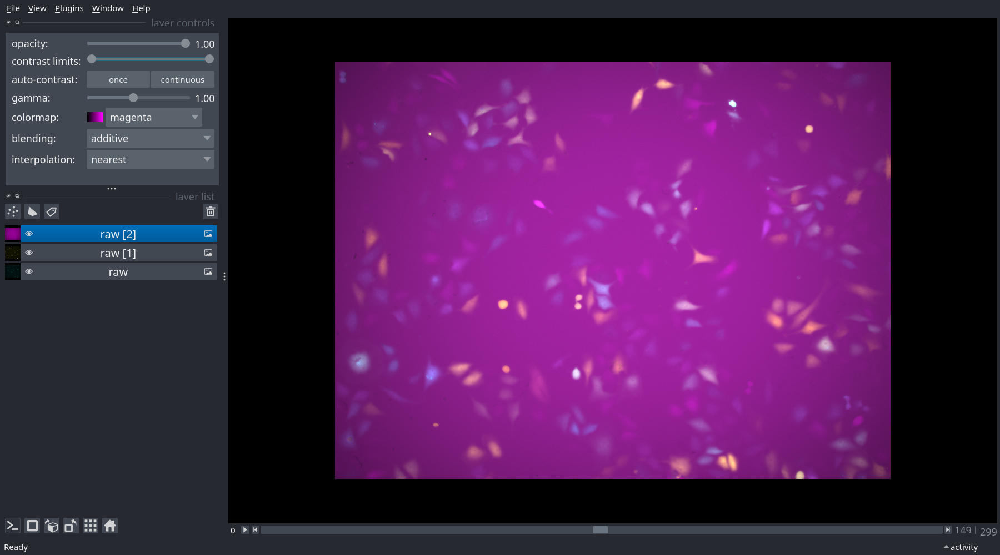

Image size (T, Y, X, C) = (300, 1440, 1920, 3)

In [6]:
# image path, change this
# (T, Y, X, C) data, where T=time, Y, X =s patial coordinates and C=channels
img_path = Path("multi-color-cytoplast.tif")

# optional, useful for a quick look
# for all frames `n_frames = None`
n_frames = None

imgs = imread(img_path)
chunks = (1, *imgs.shape[1:-1], 1) # chunk size used to compress data

if n_frames is not None:
    imgs = imgs[:n_frames]

if not COLAB:
    viewer = napari.Viewer()
    viewer.window.resize(1800, 1000)
    layers = viewer.add_image(imgs, channel_axis=3, name="raw")
    display(nbscreenshot(viewer))
    for l in layers:
        l.visible = False

print(f"Image size (T, Y, X, C) = {imgs.shape}")

As seen above, the image contains a lot of background noise.
So we use our `remove_background` helper function to remove it.
Additionaly, we manually normalize the image to the range of 0 to 1 as required by Cellpose and take the square root of it (`gamma=0.5`), we do this to decrease the dynamic range, boosting a bit Cellpose's performance.

Applying normalize ...: 100%|██████████| 900/900 [01:06<00:00, 13.53it/s]


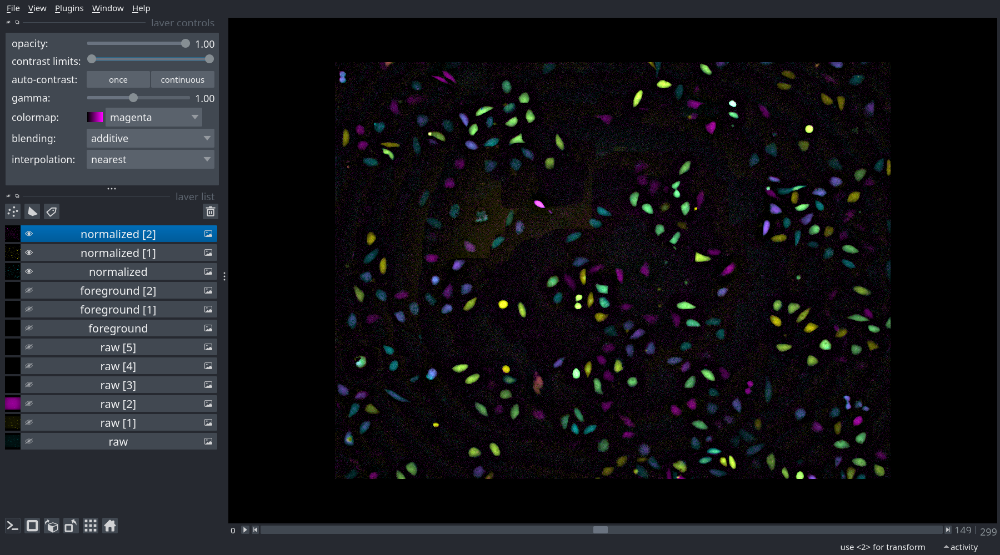

In [7]:
foreground = create_zarr(imgs.shape, imgs.dtype, "foreground.zarr", chunks=chunks, overwrite=True)
array_apply(
    imgs,
    out_array=foreground,
    func=remove_background,
    sigma=15.0,
    axis=(0, 3),
)

normalized = create_zarr(imgs.shape, np.float16, "normalized.zarr", chunks=chunks, overwrite=True)
array_apply(
    foreground,
    out_array=normalized,
    func=normalize,
    gamma=0.5,
    axis=(0, 3),
)

normalized = da.from_zarr(normalized, chunks=chunks)

if not COLAB:
    viewer.add_image(imgs, channel_axis=3, name="raw", visible=False)
    viewer.add_image(foreground, channel_axis=3, name="foreground", visible=False)
    viewer.add_image(normalized, channel_axis=3, name="normalized")

    display(nbscreenshot(viewer))

The cells look much clearer now. Next, we apply Cellpose to each channel individually because we don't have a model for 3-channel cytoplasm-labeled data. Defining a heuristic to fuse the segments from different channels can be challenging, so we use the `labels_to_edges` function to convert and combine each segment into contours.
During tracking Ultrack compares the segmentation using the contour map and selects non-overlapping segments to the tracking solution.

Applying Cellpose ...: 100%|██████████| 900/900 [12:33<00:00,  1.19it/s]


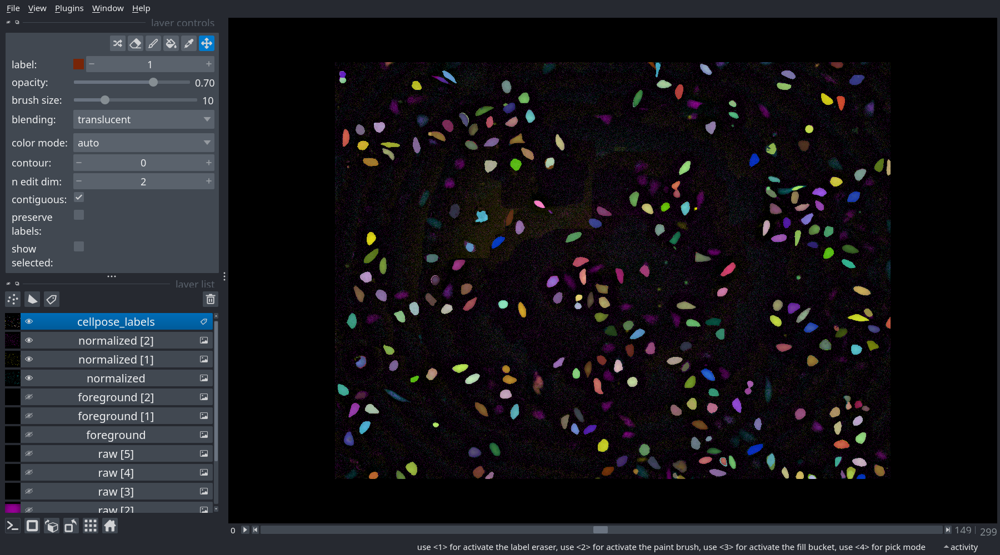

In [8]:
cellpose_labels = create_zarr(imgs.shape, np.uint16, "cellpose_labels.zarr", chunks=chunks, overwrite=True)
array_apply(
    normalized,
    out_array=cellpose_labels,
    func=Cellpose(model_type="cyto2", device=torch_default_device()),
    axis=(0, 3),
    tile=False,
    normalize=False,
)

# using dask (da = dask.array) to make a lazy array
cellpose_labels = da.from_zarr(cellpose_labels, chunks=chunks)

merged_labels = cellpose_labels.max(axis=-1)

if not COLAB:
    layer = viewer.add_labels(merged_labels, name="cellpose_labels")
    display(nbscreenshot(viewer))
    layer.visible = False  # shutting if off

Some of the dimmer cells are not detected by Cellpose, so we apply a custom routine using watershed to provide an auxiliar set of segments. We combine the watershed and Cellpose segmentations as we did with the segmentation from different channels.

In [9]:
# ws_labels = watershed_segm(normalized, cellpose_labels, min_area=250)
ws_labels = create_zarr(imgs.shape, np.int32, "ws_labels.zarr", chunks=chunks, overwrite=True)
array_apply(
    normalized,
    cellpose_labels,
    out_array=ws_labels,
    func=watershed_segm,
    min_area=250,
    axis=(0, 3),
)
ws_labels = da.from_zarr(ws_labels, chunks=chunks)

# Combining watershed results
detection, contours = labels_to_edges(
    [cellpose_labels[..., c] for c in range(cellpose_labels.shape[-1])] +\
    [ws_labels[..., c] for c in range(ws_labels.shape[-1])],
    sigma=5.0,
    detection_store_or_path=zarr.TempStore(),
    edges_store_or_path=zarr.TempStore(),
)

Converting labels to edges: 100%|██████████| 300/300 [00:14<00:00, 20.87it/s]


Finally, we can track the cells. Ultrack parameters are defined in the `MainConfig` class. Each step contains its own parameters in a subconfiguration (e.g., `config.linking_config`). These parameters were found by inspecting the tracking results.

The configuration documentation can be found [here](https://github.com/royerlab/ultrack/blob/main/ultrack/config/README.md).

In [10]:
config = MainConfig()

n_workers = 1 if COLAB else 8

# Candidate segmentation parameters
config.segmentation_config.n_workers = n_workers
config.segmentation_config.min_area = 250
config.segmentation_config.min_frontier = 0.01

# Setting the maximum number of candidate neighbors and maximum spatial distance between cells
config.linking_config.max_neighbors = 5
config.linking_config.max_distance = 50
config.linking_config.n_workers = n_workers

# Tracking integer linear programming (ILP) parameters
config.tracking_config.division_weight = -0.01
config.tracking_config.disappear_weight = -5
config.tracking_config.appear_weight = -0.5

# ILP processing window size.
# It reduces memory usage while asserting continuity in the tracks.
config.tracking_config.window_size = 15
config.tracking_config.overlap_size = 3
config.tracking_config.solution_gap = 0.01

print("ultrack config")
print(config)

ultrack config

MainConfig(
    data_config=DataConfig(working_dir=PosixPath('.'), database='sqlite', address=None, n_workers=1),
    segmentation_config=SegmentationConfig(
        threshold=0.5,
        min_area=250,
        max_area=1000000,
        min_frontier=0.01,
        anisotropy_penalization=0.0,
        max_noise=0.0,
        ws_hierarchy=<function watershed_hierarchy_by_area at 0x7f25b1780550>,
        n_workers=8
    ),
    linking_config=LinkingConfig(
        n_workers=8,
        max_neighbors=5,
        max_distance=50,
        distance_weight=0.0,
        z_score_threshold=5.0
    ),
    tracking_config=TrackingConfig(
        appear_weight=-0.5,
        disappear_weight=-5,
        division_weight=-0.01,
        dismiss_weight_guess=None,
        include_weight_guess=None,
        window_size=15,
        overlap_size=3,
        solution_gap=0.01,
        time_limit=36000,
        method=0,
        n_threads=-1,
        link_function='power',
        power=4,
        bias=-0.0
    )
)

We track the cells using the previously set `config` parameters, the combined cell detection and contour maps. Additionaly, we provide the processed raw data (`normalized`) so the tracking takes into account the segments intensity.

Linking nodes.: 100%|██████████| 299/299 [00:16<00:00, 17.70it/s]


Using GRB solver
Solving ILP batch 0
Constructing ILP ...
Solving ILP ...
Saving solution ...
Done!
Using GRB solver
Solving ILP batch 2
Constructing ILP ...
Solving ILP ...
Saving solution ...
Done!
Using GRB solver
Solving ILP batch 4
Constructing ILP ...
Solving ILP ...
Saving solution ...
Done!
Using GRB solver
Solving ILP batch 6
Constructing ILP ...
Solving ILP ...
Saving solution ...
Done!
Using GRB solver
Solving ILP batch 8
Constructing ILP ...
Solving ILP ...
Saving solution ...
Done!
Using GRB solver
Solving ILP batch 10
Constructing ILP ...
Solving ILP ...
Saving solution ...
Done!
Using GRB solver
Solving ILP batch 12
Constructing ILP ...
Solving ILP ...
Saving solution ...
Done!
Using GRB solver
Solving ILP batch 14
Constructing ILP ...
Solving ILP ...
Saving solution ...
Done!
Using GRB solver
Solving ILP batch 16
Constructing ILP ...
Solving ILP ...
Saving solution ...
Done!
Using GRB solver
Solving ILP batch 18
Constructing ILP ...
Solving ILP ...
Saving solution ...
D

Exporting segmentation masks: 100%|██████████| 300/300 [00:06<00:00, 46.15it/s]


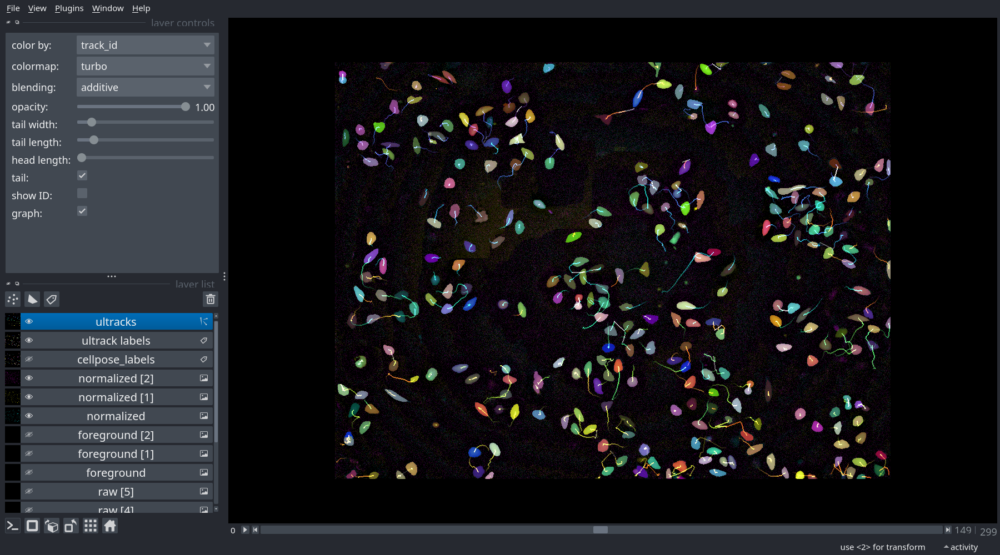

In [11]:
track(
    config,
    detection=detection,
    edges=contours,
    images=[normalized[..., c] for c in range(normalized.shape[-1])],
    overwrite=True
)

tracks_df, lineage_graph = to_tracks_layer(config)
tracking_labels = tracks_to_zarr(config, tracks_df)

if not COLAB:
    viewer.add_labels(tracking_labels, name="ultrack labels")
    viewer.add_tracks(tracks_df[["track_id", "t", "y", "x"]], graph=lineage_graph, name="ultracks")
    display(nbscreenshot(viewer))

For demonstration purposes we plot the displacement of the cells using the starting position as the origin.

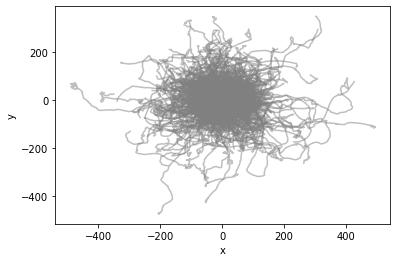

In [12]:
centered_df = plot_tracks(tracks_df)

We also export the results into the disk.

In [13]:
if COLAB:
    data_dir = img_path.parent
    img_name = img_path.name.removesuffix(".tif")
    results_dir = data_dir / img_name
    
    results_dir.mkdir(exist_ok=True)
else:
    results_dir = Path(".")

tracks_df.to_csv(results_dir / "tracks.csv", index=False)

imwrite(results_dir / "segments.tif", tracking_labels)
imwrite(results_dir / "cellpose_segments.tif", merged_labels)

# to_trackmate(config, results_dir / "tracks.xml", overwrite=True)

print(f"Saved results into {results_dir}")

Saved results into .